# Итоговый проект

## Предсказание рейтинга настольных игр

В общем случае процесс решения задач возникающих в Машинном обучении состоит из следующих этапов:

1. Очистка и форматирование данных
2. Предварительный анализ данных
3. Выбор наиболее полезных признаков и создание новых более репрезентативных
4. Сравнение качества работы нескольник моделей
5. Оптимизация гиперпараметров в лучшей модели
6. Проверка модели на тестовой выборке
7. Интерпретация результатов
8. Итоговое представление результатов работы

### Раздел 1. Постановка цели и описание данных.

**Данные:** [данные](https://www.kaggle.com/datasets/caesuric/bgggamesdata) взяты с платформы Kaggle, данные о рейтинге настольных игр с сайта [BGG](https://boardgamegeek.com/)

**Цель:** предсказать рейтинг настольной игры и понять, какие признаки оказывают на него сильнейшее влияние.

Данные уже содержат в себе ***rating***, так что задача относится к классу задач Машинного обучения с учителем, и предсталяет собой построение регрессии:

- **Обучение с учителем:** у нас есть как все необходимые признаки, на основе которых выполняется предсказание, так и сам целевой признак.
- **Регрессия:** будем считать, что рейтинг настольной игры - это непрерывная величина.

В конечном итогенужно построитькак можно более точную модель, которая на выходе дает легкоинтерпретируемые результаты, то есть мы сможем понять на основании чего модель делает тот или иной вывод.

#### Импорт всех необходимых для работы библиотек и загрузка данных

In [1]:
# Импортируем необходимые библиотеки для предобработки датасетов

import pandas as pd
import numpy as np

# для работы с текстом
import re
from wordcloud import WordCloud, STOPWORDS 
import string
from nltk.util import ngrams
from collections import Counter

import sys

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # интерактивная визуализация
from pylab import rcParams

%matplotlib inline
rcParams['figure.figsize'] = 12,6

# from sklearn.feature_selection import f_classif, mutual_info_classif
# from itertools import combinations
# from scipy.stats import ttest_ind

In [2]:
import warnings # для работы с предупреждениями

warnings.filterwarnings('ignore')

In [3]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [4]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

In [5]:
bgg_data = pd.read_csv('data/basic_data.csv')

In [6]:
bgg_data.head()

,name,description,thumbnail,image,rating,bayes_rating,usersrated,bggrank,stddev,owned,...,wishing,numweights,averageweight,yearpublished,minplayers,maxplayers,playingtime,minplaytime,maxplaytime,age
0,Die Macher,Die Macher is a game about seven sequential po...,https://cf.geekdo-images.com/thumb/img/Y2pmp3_...,https://cf.geekdo-images.com/original/img/uqlr...,7.62855,7.14730,5054,262,1.58914,6855,...,1960,750,4.3347,1986.0,3.0,5.0,240.0,240.0,240.0,14.0
1,Dragonmaster,Dragonmaster is a trick-taking card game based...,https://cf.geekdo-images.com/thumb/img/2tQqL6w...,https://cf.geekdo-images.com/original/img/o07K...,6.61412,5.80514,545,3473,1.44458,1236,...,175,54,1.9630,1981.0,3.0,4.0,30.0,30.0,30.0,12.0
2,Samurai,Samurai is set in medieval Japan. Players comp...,https://cf.geekdo-images.com/thumb/img/BOzp5hz...,https://cf.geekdo-images.com/original/img/mPS5...,7.44438,7.24579,14332,200,1.18342,14756,...,3170,1432,2.4916,1998.0,2.0,4.0,60.0,30.0,60.0,10.0
3,Tal der Könige,When you see the triangular box and the luxuri...,https://cf.geekdo-images.com/thumb/img/aqEMohP...,https://cf.geekdo-images.com/original/img/TgcS...,6.61683,5.70180,334,4583,1.23365,616,...,121,30,2.6667,1992.0,2.0,4.0,60.0,60.0,60.0,12.0
4,Acquire,"In Acquire, each player strategically invests ...",https://cf.geekdo-images.com/thumb/img/ZODhu5g...,https://cf.geekdo-images.com/original/img/Bz4t...,7.34397,7.16294,17800,254,1.33547,22550,...,2511,1586,2.5057,1964.0,2.0,6.0,90.0,90.0,90.0,12.0


In [7]:
bgg_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286186 entries, 0 to 286185
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   name           286186 non-null  object 
 1   description    286186 non-null  object 
 2   thumbnail      246151 non-null  object 
 3   image          246151 non-null  object 
 4   rating         286186 non-null  float64
 5   bayes_rating   286186 non-null  float64
 6   usersrated     286186 non-null  int64  
 7   bggrank        286186 non-null  object 
 8   stddev         286186 non-null  float64
 9   owned          286186 non-null  int64  
 10  trading        286186 non-null  int64  
 11  wanting        286186 non-null  int64  
 12  wishing        286186 non-null  int64  
 13  numweights     286186 non-null  int64  
 14  averageweight  286186 non-null  float64
 15  yearpublished  118643 non-null  float64
 16  minplayers     118643 non-null  float64
 17  maxplayers     118643 non-nul

На платформе описания признаков нет, поэтому постараемся самостоятельно описать признаки:

1. **name** - название настольной игры
0. **description** - описание настольной игры
0. **thumbnail** - миниатюра
0. **image** - изображение
0. **rating** - рейтинг, наша целевая переменная
0. **bayes_rating** - байесовский рейтинг
0. **usersrated** - кол-во голосов
0. **bggrank** - ранг BGG
0. **stddev** - стандартное отклонение
0. **owned** - кол-во владельцев игры
0. **trading** - кол-во продающих
0. **wanting** - кол-во пользователей, желающих сыграть в игру
0. **wishing** - кол-во пользователей, желающих приобрести игру
0. **numweights** - кол-во пользователей, указавших вес игры (сложность)
0. **averageweight** - средний вес игры (сложность)
0. **yearpublished** - год выпуска игры
0. **minplayers** - минимальное кол-во игроков
0. **maxplayers** - максимальное кол-во игроков
0. **playingtime** - игровое время партии (обычно указывается производителем)
0. **minplaytime** - минимальное время партии
0. **maxplaytime** - максимальное время партии
0. **age** - минимальный возраст игроков

In [8]:
bgg_data.isnull().sum()

name                  0
description           0
thumbnail         40035
image             40035
rating                0
bayes_rating          0
usersrated            0
bggrank               0
stddev                0
owned                 0
trading               0
wanting               0
wishing               0
numweights            0
averageweight         0
yearpublished    167543
minplayers       167543
maxplayers       167543
playingtime      167543
minplaytime      167543
maxplaytime      167543
age              167543
dtype: int64

Работать в этом проекте с изображениями не будем, поэтому удаляем признаки `'thumbnail', 'image'`

In [9]:
bgg_data.drop(['thumbnail', 'image'], axis = 1, inplace=True)
bgg_data.fillna(0, inplace=True) # заменяем все пропуски в данных нулями, т.к. их большое кол-во и очевидно, что данные просто отсутствуют

In [10]:
bgg_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286186 entries, 0 to 286185
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   name           286186 non-null  object 
 1   description    286186 non-null  object 
 2   rating         286186 non-null  float64
 3   bayes_rating   286186 non-null  float64
 4   usersrated     286186 non-null  int64  
 5   bggrank        286186 non-null  object 
 6   stddev         286186 non-null  float64
 7   owned          286186 non-null  int64  
 8   trading        286186 non-null  int64  
 9   wanting        286186 non-null  int64  
 10  wishing        286186 non-null  int64  
 11  numweights     286186 non-null  int64  
 12  averageweight  286186 non-null  float64
 13  yearpublished  286186 non-null  float64
 14  minplayers     286186 non-null  float64
 15  maxplayers     286186 non-null  float64
 16  playingtime    286186 non-null  float64
 17  minplaytime    286186 non-nul

In [11]:
# так как в датасете довольно много отсутствующих данных
# идалим данные, у которых пропуски в ключевых столбцах
bgg_df = bgg_data.loc[(bgg_data['rating'] != 0) | (bgg_data['averageweight'] != 0) | (bgg_data['yearpublished'] != 0) | (bgg_data['age'] != 0)]

bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168513 entries, 0 to 286185
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   name           168513 non-null  object 
 1   description    168513 non-null  object 
 2   rating         168513 non-null  float64
 3   bayes_rating   168513 non-null  float64
 4   usersrated     168513 non-null  int64  
 5   bggrank        168513 non-null  object 
 6   stddev         168513 non-null  float64
 7   owned          168513 non-null  int64  
 8   trading        168513 non-null  int64  
 9   wanting        168513 non-null  int64  
 10  wishing        168513 non-null  int64  
 11  numweights     168513 non-null  int64  
 12  averageweight  168513 non-null  float64
 13  yearpublished  168513 non-null  float64
 14  minplayers     168513 non-null  float64
 15  maxplayers     168513 non-null  float64
 16  playingtime    168513 non-null  float64
 17  minplaytime    168513 non-nul

In [12]:
# преобразовать в формат int
col_int_type_list = ['usersrated', 'owned', 'wanting',
        'wishing', 'numweights', 'yearpublished',
        'minplayers', 'maxplayers', 'playingtime',
        'minplaytime', 'maxplaytime', 'age']

for i in col_int_type_list:
    bgg_df[i] = bgg_df[i].astype('int64')
    
bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168513 entries, 0 to 286185
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   name           168513 non-null  object 
 1   description    168513 non-null  object 
 2   rating         168513 non-null  float64
 3   bayes_rating   168513 non-null  float64
 4   usersrated     168513 non-null  int64  
 5   bggrank        168513 non-null  object 
 6   stddev         168513 non-null  float64
 7   owned          168513 non-null  int64  
 8   trading        168513 non-null  int64  
 9   wanting        168513 non-null  int64  
 10  wishing        168513 non-null  int64  
 11  numweights     168513 non-null  int64  
 12  averageweight  168513 non-null  float64
 13  yearpublished  168513 non-null  int64  
 14  minplayers     168513 non-null  int64  
 15  maxplayers     168513 non-null  int64  
 16  playingtime    168513 non-null  int64  
 17  minplaytime    168513 non-nul

In [13]:
len(bgg_df[bgg_df['bggrank'] == 'Not Ranked'])

149356

In [14]:
# заменим отсутствие ранга отрицательным значением
bgg_df['bggrank'] = bgg_df['bggrank'].apply(lambda x: '-1' if x=='Not Ranked' else x)

In [15]:
bgg_df['bggrank'] = bgg_df['bggrank'].astype('int64')

In [16]:
bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168513 entries, 0 to 286185
Data columns (total 20 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   name           168513 non-null  object 
 1   description    168513 non-null  object 
 2   rating         168513 non-null  float64
 3   bayes_rating   168513 non-null  float64
 4   usersrated     168513 non-null  int64  
 5   bggrank        168513 non-null  int64  
 6   stddev         168513 non-null  float64
 7   owned          168513 non-null  int64  
 8   trading        168513 non-null  int64  
 9   wanting        168513 non-null  int64  
 10  wishing        168513 non-null  int64  
 11  numweights     168513 non-null  int64  
 12  averageweight  168513 non-null  float64
 13  yearpublished  168513 non-null  int64  
 14  minplayers     168513 non-null  int64  
 15  maxplayers     168513 non-null  int64  
 16  playingtime    168513 non-null  int64  
 17  minplaytime    168513 non-nul

In [17]:
# Создадим списки признаков в зависимости от их типа:

# категориальные признаки
cols_cat = []
# бинарные признаки
cols_bin = []
# числовые признаки
cols_num = ['usersrated', 'bggrank', 'stddev',
            'owned', 'trading', 'wanting',
            'wishing', 'numweights', 'averageweight',
            'yearpublished', 'minplayers', 'maxplayers',
            'playingtime', 'minplaytime', 'maxplaytime',
            'age']

# информационные признаки, при обучении они нам не понадобятся
cols_inf = ['name', 'description']
# целевая переменная + возможно дублирующая переменная
col_target = ['rating', 'bayes_rating'] 

### Обработка признака `name`

In [18]:
# замена пропусков
bgg_df['name'].fillna('', inplace=True)

In [19]:
# уменьшаем регистр
bgg_df['name'] = bgg_df['name'].apply(lambda x: x.lower())

In [20]:
# создадим переменную с длиной наименования игры, по символам
bgg_df['len_name'] = bgg_df['name'].apply(lambda x: len(x))

count    168513.000000
mean         23.082308
std          15.063851
min           1.000000
25%          12.000000
50%          19.000000
75%          31.000000
max         255.000000
Name: len_name, dtype: float64

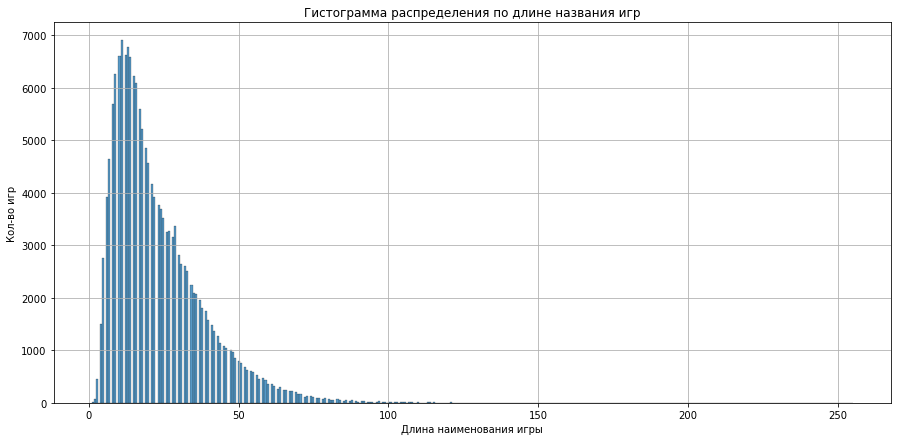

In [21]:
display(bgg_df['len_name'].describe())
# строим распределение признака len_name
fig, axes = plt.subplots(figsize=(15, 7)) 
histplot=sns.histplot(
    data=bgg_df, 
    x='len_name',
    ax=axes
)
histplot.set_title('Гистограмма распределения по длине названия игр')
histplot.set_ylabel('Кол-во игр')
histplot.set_xlabel('Длина наименования игры')
histplot.grid()

Видим довольно большой хвост справа и довольно большие значения для наименования игр.

In [22]:
display(bgg_df[bgg_df['len_name'] > 150])

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,numweights,averageweight,yearpublished,minplayers,maxplayers,playingtime,minplaytime,maxplaytime,age,len_name
49542,being a role-playing game on the topic of the ...,From the text:<br/><br/><br/> &quot;LET...,5.33333,0.0,3,-1,1.69967,17,0,0,...,1,1.0,0,0,0,0,0,0,0,245
56948,royal genealogical pastime of the sovereigns o...,The game is a race over the shields of 52 mona...,0.00000,0.0,0,-1,0.00000,0,0,0,...,0,0.0,1791,2,0,0,0,0,0,152
57545,the new game of emulation: designed for the am...,A race game of Moral Improvement. From No 1 Tu...,1.50000,0.0,2,-1,0.50000,0,0,0,...,0,0.0,1804,2,0,0,0,0,0,162
59795,tableau chronologique de l'histoire universéle...,A French game for children made for an educati...,0.00000,0.0,0,-1,0.00000,0,0,0,...,0,0.0,1717,0,0,0,0,0,0,153
118470,"a game where an enclosed short young lady, a p...",User summary<br/><br/>A game where an enclosed...,4.57143,0.0,7,-1,3.01696,3,0,7,...,0,0.0,2007,2,5,10,10,10,6,248
124163,the wargaming pioneers: including little wars ...,From the back cover:&quot;Prior to Donald Feat...,8.50000,0.0,4,-1,1.65831,7,0,0,...,0,0.0,2011,0,0,0,0,0,0,154
192996,"a game, wherein you blether (a scottish word m...","In this game, you must use an increasing numbe...",7.00000,0.0,5,-1,3.16228,2,0,3,...,0,0.0,0,4,6,60,25,60,10,255
211974,the free animal republic of macdonald (f.a.r.m...,synopsis from the website<br/><br/>One year ag...,8.00000,0.0,1,-1,0.00000,0,0,0,...,0,0.0,0,0,0,0,0,0,0,173
273812,the falcon and the gladiator: the air war over...,The Falcon and the Gladiator: The Air War Over...,0.00000,0.0,0,-1,0.00000,0,0,0,...,0,0.0,2012,2,8,120,120,120,12,161
280318,modern equipment handbook: part two – equipmen...,'Modern Equipment Handbook: Part Two - Equipme...,0.00000,0.0,0,-1,0.00000,0,0,0,...,0,0.0,1998,2,2,0,0,0,12,151


Все игры > 150 символов в наименовании не имеют `bayes_rating и bggrank`. Но у некоторых довольно большой рейтинг.

In [23]:
cols_num += ['len_name'] # добавляем признак к числовым

In [24]:
# функция создания карты самых частых слов и сочетаний
def words(series, new_stopwords=[]):
    stopwords = set(STOPWORDS) 

    #new_stopwords = []

    stopwords.update(new_stopwords)

    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=300,
        max_font_size=200,
        width=1000,
        height=800,
        random_state=42
    ).generate(" ".join(series.astype(str)))

    # plot the WordCloud image                        
    plt.figure(
        figsize = (12, 14),
        facecolor = None
    ) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    return plt.show()

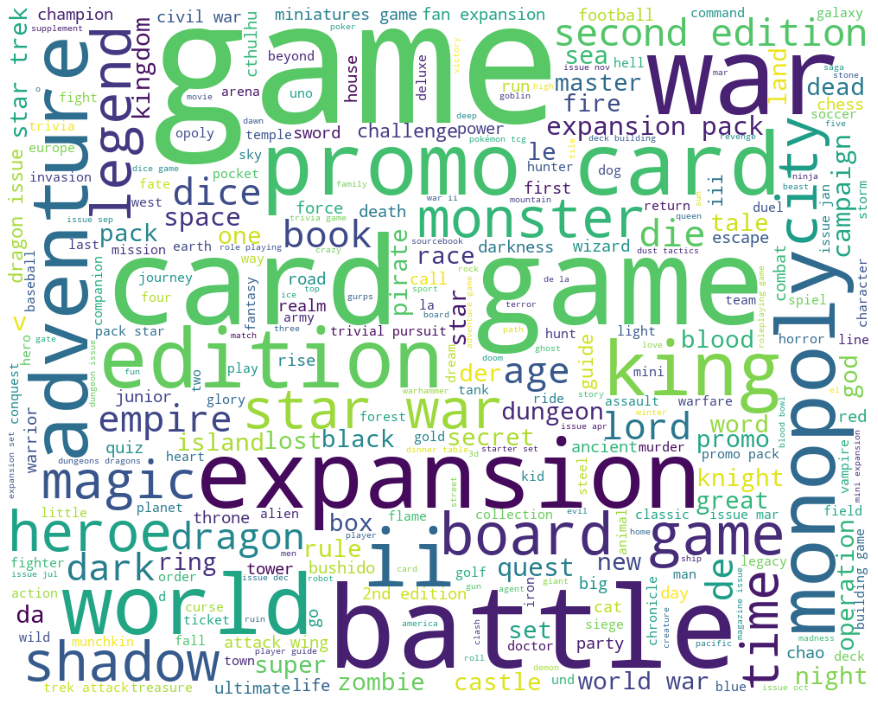

In [25]:
words(bgg_df['name'])

In [26]:
# функция создает бинарную переменную по заданным словам
def create_dummy(comment, words):
    if comment == []:
        return 0
    
    words = list(words)
    for word in words:
        if word in comment:
            return 1
    
    return 0

In [27]:
def new_columns(col, list_top_words):
    for word in list_top_words:
        bgg_df[word] = bgg_df[col].apply(lambda x: create_dummy(x, word))
    
    return

In [28]:
# создание переменных на основе самых часто встречаемых слов или словочетаний

bgg_df['card_name'] = bgg_df['name'].apply(lambda x: create_dummy(x, ['promo card', 'card game']))
bgg_df['battle_name'] = bgg_df['name'].apply(lambda x: create_dummy(x, 'battle'))
bgg_df['board_game_name'] = bgg_df['name'].apply(lambda x: create_dummy(x, 'board game'))

list_top_words_name = ['game', 'monopoly', 'expansion',
                       'war', 'king', 'second edition',
                       'expansion pack', 'dice']

new_columns('name', list_top_words_name)

In [29]:
# добавляем признаки в список бинарных переменных
cols_bin += ['card_name', 'battle_name', 'board_game_name',
             'game', 'monopoly', 'expansion',
             'war', 'king', 'second edition',
             'expansion pack', 'dice']

### Обработка признака `description` 

In [30]:
# заменяем пропуски
bgg_df['description'].fillna('', inplace=True)

In [31]:
# понижаем регистр
bgg_df['description'] = bgg_df['description'].apply(lambda x: x.lower())

In [32]:
bgg_df['description'][101]

"the hexagonal board has several holes in it for the unique playing pieces.  each player uses sand timers as his pieces, and a turn is simply to move to an adjacent space, flipping the timer in the process.  the number of times that each space on the board can be occupied is limited, but the more central spaces can have more traffic.  the object of the game is simply to have any of your pieces movable when your opponent's pieces are either locked in place, or out of sand.<br/><br/>this game was originally part of project gipf.<br/><br/>"

In [33]:
# отчистка описания с помощью библиотеки re
bgg_df['description'] = bgg_df['description'].apply(lambda x: re.sub(r'<br/>', '', x))
bgg_df['description'] = bgg_df['description'].apply(lambda x: re.sub(r'\t', '', x))

In [34]:
# создадим переменную с длиной комментария, по символам
bgg_df['len_description'] = bgg_df['description'].apply(lambda x: len(x))

count    168513.000000
mean        818.764267
std         679.880838
min           1.000000
25%         381.000000
50%         649.000000
75%        1049.000000
max       14759.000000
Name: len_description, dtype: float64

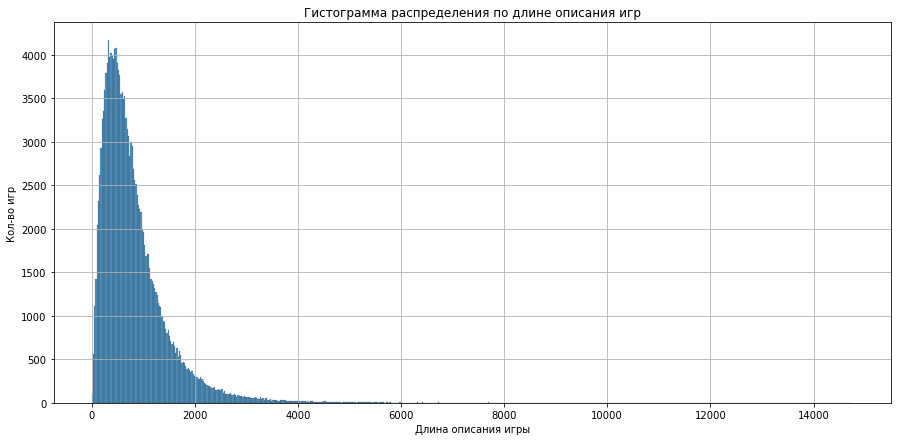

In [35]:
display(bgg_df['len_description'].describe())
# строим распределение признака len_name
fig, axes = plt.subplots(figsize=(15, 7))
histplot=sns.histplot(
    data=bgg_df, 
    x='len_description',
    ax=axes
)
histplot.set_title('Гистограмма распределения по длине описания игр')
histplot.set_ylabel('Кол-во игр')
histplot.set_xlabel('Длина описания игры')
histplot.grid()

In [36]:
display(bgg_df[bgg_df['len_description'] > 6000])

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,board_game_name,game,monopoly,expansion,war,king,second edition,expansion pack,dice,len_description
203,history of the world,history of the world works under the assumptio...,7.12447,6.66667,4307,742,1.51265,5300,257,153,...,1,1,1,1,1,1,1,1,1,7041
623,heroquest,heroquest is milton bradley's approach to a du...,7.12953,6.80562,10496,572,1.56704,15738,481,333,...,1,1,1,1,1,0,1,1,1,9293
4333,mysteries by vincent: case of the wirst case s...,how to host a murder styled party game. no au...,6.50000,0.00000,1,-1,0.00000,1,0,1,...,1,1,1,1,1,1,1,1,1,6290
4352,mysteries by vincent: murder on the millennium,how to host a murder styled party game. no au...,0.00000,0.00000,0,-1,0.00000,1,0,1,...,1,1,1,1,1,1,1,1,1,6017
12348,the planet management game,the planet management game&trade;players have ...,4.50000,0.00000,2,-1,0.50000,6,3,1,...,1,1,1,1,1,1,1,1,1,9158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270641,battle of the somme,"battle of the somme is a solitaire, tactical (...",8.26667,0.00000,3,-1,1.31993,7,0,2,...,1,1,1,1,1,0,1,1,1,6936
271970,warhammer age of sigmar gaming book,warhammer age of sigmar is more than a game &n...,10.00000,0.00000,1,-1,0.00000,4,0,0,...,1,1,1,1,1,1,1,1,1,8393
277037,commands & colors: napoleonics expansion 7 – l...,the commands &amp; colors: napoleonics game sy...,0.00000,0.00000,0,-1,0.00000,3,0,5,...,1,1,1,1,1,1,1,1,1,7709
278924,godzilla rampage: kaiju unleashed,game objective &ndash; players choose kaiju an...,10.00000,0.00000,1,-1,0.00000,1,0,0,...,1,1,1,1,1,1,1,1,1,8796


In [37]:
cols_num += ['len_description'] # добавляем признак к числовым

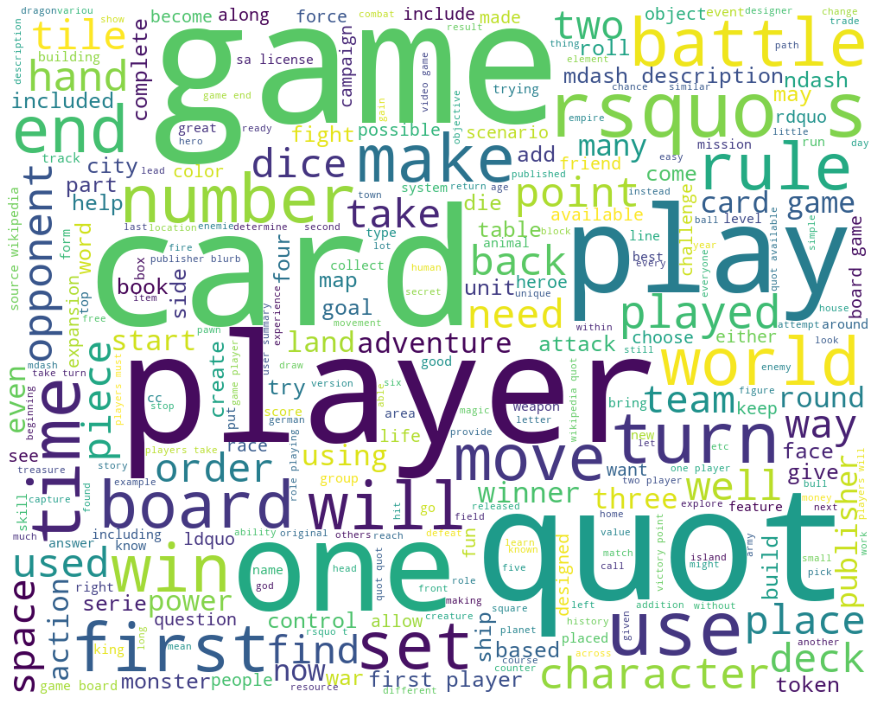

In [38]:
words(bgg_df['description'])

In [39]:
# создание переменных на основе самых часто встречаемых слов или словочетаний

bgg_df['card_d'] = bgg_df['description'].apply(lambda x: create_dummy(x, 'card'))
bgg_df['game_d'] = bgg_df['description'].apply(lambda x: create_dummy(x, 'game'))
bgg_df['battle_d'] = bgg_df['description'].apply(lambda x: create_dummy(x, 'battle'))

list_top_words_d = ['one', 'bord', 'play',
                       'quot', 'turn', 'player',
                       'win', 'number', 'time',
                       'move', 'rule', 'first',
                       'opponent']

new_columns('description', list_top_words_d)

In [40]:
cols_bin += ['card_d', 'game_d', 'battle_d',
             'one', 'bord', 'play',
             'quot', 'turn', 'player',
             'win', 'number', 'time',
             'move', 'rule', 'first',
             'opponent']

In [41]:
bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168513 entries, 0 to 286185
Data columns (total 49 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   name             168513 non-null  object 
 1   description      168513 non-null  object 
 2   rating           168513 non-null  float64
 3   bayes_rating     168513 non-null  float64
 4   usersrated       168513 non-null  int64  
 5   bggrank          168513 non-null  int64  
 6   stddev           168513 non-null  float64
 7   owned            168513 non-null  int64  
 8   trading          168513 non-null  int64  
 9   wanting          168513 non-null  int64  
 10  wishing          168513 non-null  int64  
 11  numweights       168513 non-null  int64  
 12  averageweight    168513 non-null  float64
 13  yearpublished    168513 non-null  int64  
 14  minplayers       168513 non-null  int64  
 15  maxplayers       168513 non-null  int64  
 16  playingtime      168513 non-null  int6

### Обработка `bggrank`

In [42]:
len(bgg_df[bgg_df['bggrank'] <= 0]) # кол-во ненулевых значений ранга

149356

count    19157.000000
mean      9578.346349
std       5530.075618
min          1.000000
25%       4790.000000
50%       9576.000000
75%      14368.000000
max      19156.000000
Name: bggrank, dtype: float64

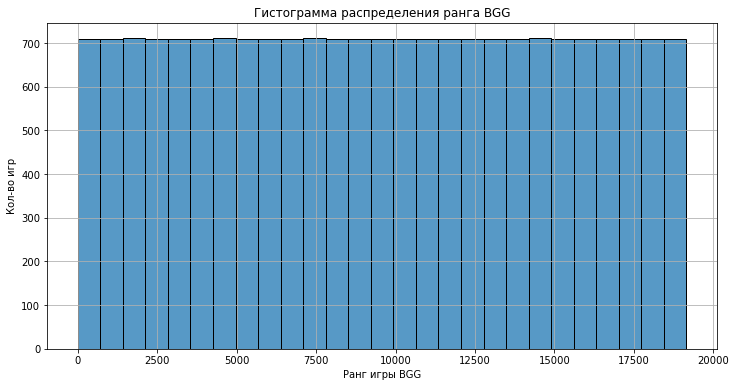

In [43]:
bgg_rang = bgg_df[bgg_df['bggrank'] > 0] # условие 

display(bgg_rang['bggrank'].describe())
# построим распределение ранга
fig, axes = plt.subplots(figsize=(12, 6))
histplot=sns.histplot(
    data=bgg_rang, 
    x='bggrank',
    ax=axes
)
histplot.set_title('Гистограмма распределения ранга BGG')
histplot.set_ylabel('Кол-во игр')
histplot.set_xlabel('Ранг игры BGG')
histplot.grid()

Большое кол-во игр имеют ранг равный 0. Ранг BGG находится в диапазоне от 1 до 19156, на каждый ранг приходится чуть больше 700 игр.

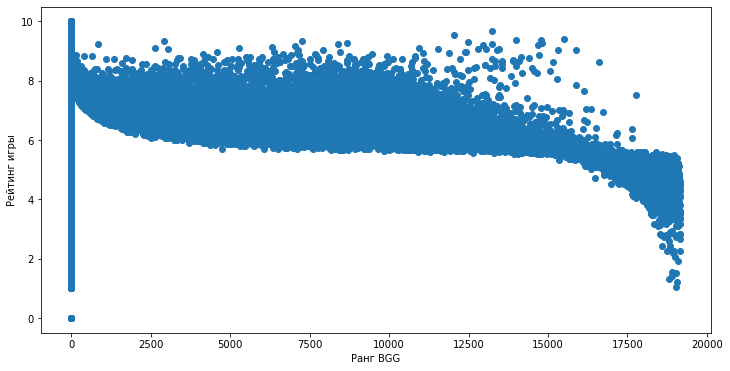

In [44]:
# построим зависимость ранга от целевой переменной
plt.scatter(
    bgg_df['bggrank'],
    bgg_df['rating'],
)
plt.xlabel("Ранг BGG")
plt.ylabel("Рейтинг игры")
plt.show()

Видим, что достаточно большое кол-во имеет нулевой ранг. Из тех игр, которым присвоем ранг до 16000 игры имеют рейтинг выше 6, после 16000 рейтинг игр падает.

### Обработка `usersrated`

In [45]:
display(bgg_df['usersrated'].describe())

count    168513.000000
mean        111.271837
std        1172.757729
min           0.000000
25%           1.000000
50%           3.000000
75%          14.000000
max       95414.000000
Name: usersrated, dtype: float64

In [46]:
# построим интерактивную гистограмму, чтобы внимательнее изучить распределение
fig = px.histogram(
    bgg_df,
    x='usersrated',
    labels={'usersrated':'кол-во оценок', 'y':'Количество игр'},
    marginal='box',
    nbins=30,
    width=1000,
    height=500
)
fig.update_layout(
    title=dict(
        text='Распределение кол-во оценок игр',
        yanchor='top',
        font_size=20
    )
)
fig.show()

In [47]:
print(len(bgg_df[bgg_df['usersrated'] > 40000])) # кол-во игр с аномально высоким значением
np.round(bgg_df[bgg_df['usersrated'] > 40000]['rating'].mean(), 2) # средний рейтинг игр с аномально выслким значением 

26


7.66

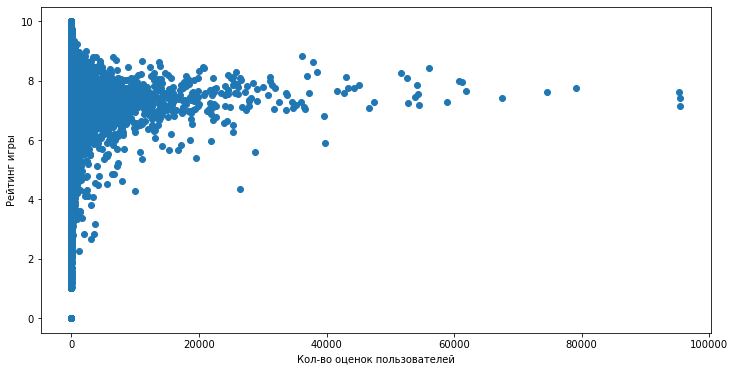

In [48]:
# построим график зависимости кол-ва оценок пользователей от рейтинга
plt.scatter(
    bgg_df['usersrated'],
    bgg_df['rating'],
)
plt.xlabel("Кол-во оценок пользователей")
plt.ylabel("Рейтинг игры")
plt.show()

In [49]:
bgg_df[bgg_df['usersrated'] > 70000]

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,quot,turn,player,win,number,time,move,rule,first,opponent
12,catan,"in catan (formerly the settlers of catan), pla...",7.16442,7.00212,95414,376,1.47910,143040,1808,466,...,1,1,1,1,1,1,1,1,1,1
733,carcassonne,carcassonne is a tile-placement game in which ...,7.41936,7.31268,95405,171,1.30454,138497,1575,536,...,1,1,1,1,1,1,1,1,1,1
28186,pandemic,"in pandemic, several virulent diseases have br...",7.61716,7.52017,95286,89,1.32601,143028,2172,647,...,1,1,1,1,1,1,1,1,1,1
33485,dominion,"&quot;you are a monarch, like your parents bef...",7.62886,7.52261,74484,87,1.42453,97017,1889,629,...,1,1,1,1,1,1,1,1,1,1
61613,7 wonders,you are the leader of one of the 7 great citie...,7.76195,7.66299,79128,50,1.27681,105012,1374,1039,...,1,1,1,1,1,1,1,1,1,1


Можем сделать вывод, что игры с аномальным кол-вом оценок пользователей являются очень популярными и имеют довольно высокий средний рейтинг. Поэтому решила оставить эти значения и не удалять их как выбросы.

In [50]:
# функция определяющая к какой категории популярности относится игра
def userstar_to_cat(userstar):
    if userstar == 0:
        return 'not star'
    elif userstar < 100:
        return 'not pop'
    elif (userstar >= 100) and (userstar <= 1000):
        return 'pop'
    elif (userstar > 1000) and (userstar < 20000):
        return 'star'
    elif userstar >= 20000:
        return 'super star'

In [51]:
# создадим новый признак, категория по популярности
bgg_df['cat_userstar'] = bgg_df['usersrated'].apply(userstar_to_cat)

not pop       126080
not star       27849
pop            11673
star            2802
super star       109
Name: cat_userstar, dtype: int64

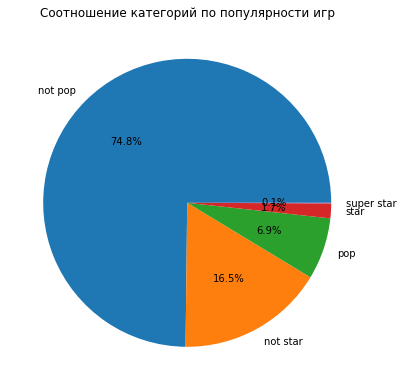

In [52]:
# посмотрим распределение
cat_userstar = bgg_df['cat_userstar'].value_counts()
display(cat_userstar)

fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    cat_userstar,
    labels=cat_userstar.index,
    autopct='%.1f%%', #округление до первого знака после запятой
)
axes.set_title('Соотношение категорий по популярности игр');

Самое большое кол-во игр относится к категории 'not pop', то есть не популярных (менее 100 оценок пользователей), их почти 75%. А вот самой маленькой категорий, как и ожидалось, стала 'super star', то есть самые популярные игры по кол-ву оценок пользователей (больше 20000 оценок).

In [53]:
cols_cat += ['cat_userstar'] # добавляем признак к категориальным

### Обработка `stddev`

In [54]:
display(bgg_df['stddev'].describe())

count    168513.000000
mean          0.855574
std           0.826565
min           0.000000
25%           0.000000
50%           0.935414
75%           1.479290
max           4.500000
Name: stddev, dtype: float64

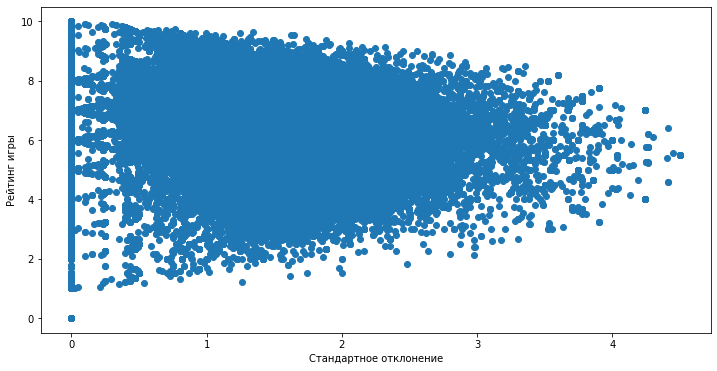

In [55]:
# так как физически этот признак не имеет значимости, а был искусственно выведен
# мы просто смотрим его зависимость от целевой переменно
plt.scatter(
    bgg_df['stddev'],
    bgg_df['rating'],
)
plt.xlabel("Стандартное отклонение")
plt.ylabel("Рейтинг игры")
plt.show()

Видим большое кол-во нулевых значений, которые не зависят от рейтинга. В целом видно, что большее отклонение характерно для игр со средним рейтингом. От 0 до 0.5 можем наблюдать интересную зависимость, в виде исходящих треугольников, которая характерна для рейтингов 3-8, и ели заметна на 2 и 9.

### Обработка `owner`, `trading`, `wanting`, `wishing`

Расматриваем признаки `owner`, `trading`, `wanting`, `wishing` вместе, так как они очень похожи по смыслу и скорей всего имеют сильную корреляцию между собой.

In [56]:
# Посмотрим на распределение признаков
display('Распределение кол-ва покупок игр', bgg_df['owned'].describe())
display('Распределение кол-ва продаваемых игр', bgg_df['trading'].describe())
display('Распределение кол-ва желающих сыграть в игру', bgg_df['wanting'].describe())
display('Распределение кол-ва желающих приобрести игру', bgg_df['wishing'].describe())

'Распределение кол-ва покупок игр'

count    168513.000000
mean        231.818619
std        1742.843569
min           0.000000
25%           2.000000
50%          11.000000
75%          56.000000
max      143040.000000
Name: owned, dtype: float64

'Распределение кол-ва продаваемых игр'

count    168513.000000
mean          6.653392
std          37.126746
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max        2382.000000
Name: trading, dtype: float64

'Распределение кол-ва желающих сыграть в игру'

count    168513.000000
mean          7.283035
std          44.260612
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max        2084.000000
Name: wanting, dtype: float64

'Распределение кол-ва желающих приобрести игру'

count    168513.000000
mean         31.418502
std         249.964131
min           0.000000
25%           0.000000
50%           1.000000
75%           6.000000
max       16040.000000
Name: wishing, dtype: float64

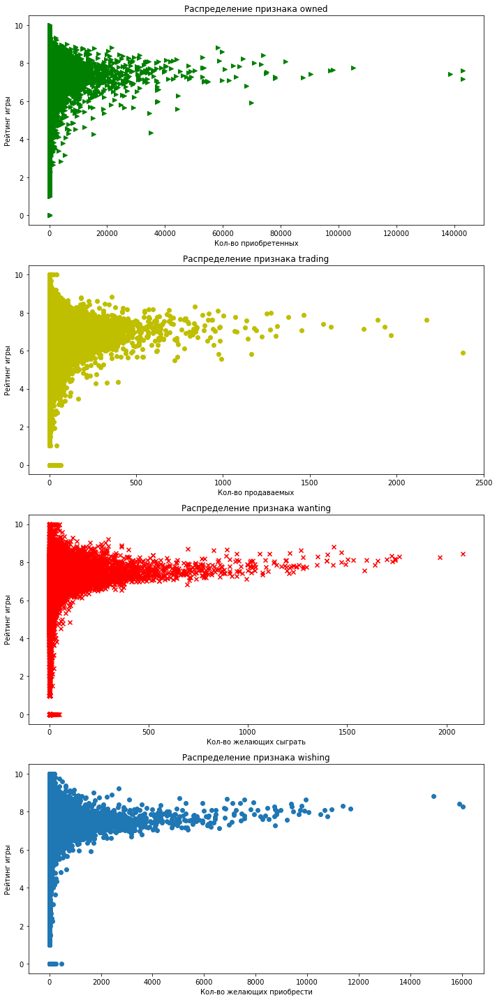

In [57]:
fig, axs = plt.subplots(4, 1, figsize=(10, 20))

# owned
axs[0].scatter(
    bgg_df['owned'],
    bgg_df['rating'],
    marker=">",
    color='g'
)
axs[0].set_title("Распределение признака owned")
axs[0].set_xlabel("Кол-во приобретенных")
axs[0].set_ylabel("Рейтинг игры")

# trading
axs[1].scatter(
    bgg_df['trading'],
    bgg_df['rating'],
    marker="o",
    color='y'
)
axs[1].set_title("Распределение признака trading")
axs[1].set_xlabel("Кол-во продаваемых")
axs[1].set_ylabel("Рейтинг игры")

# wanting
axs[2].scatter(
    bgg_df['wanting'],
    bgg_df['rating'],
    marker="x",
    color='r'
)
axs[2].set_title("Распределение признака wanting")
axs[2].set_xlabel("Кол-во желающих сыграть")
axs[2].set_ylabel("Рейтинг игры")

# wishing
axs[3].scatter(
    bgg_df['wishing'],
    bgg_df['rating']
)
axs[3].set_title("Распределение признака wishing")
axs[3].set_xlabel("Кол-во желающих приобрести")
axs[3].set_ylabel("Рейтинг игры")

plt.tight_layout()
plt.show()

В каждом признаке большое кол-во нулевых значений.  
Видим, что распределение этих признаков почти одинаково.  
Самый большой интерес у пользователей вызывают настольные игры с рейтингом выше 6, и что довольно странно ниже 9.  
Из-за похожести распределений, скорей всего будет большая корреляция между признаками. 
Так же в каждом признаке видим выбросы с аномально большими значениями. Удалять их не будем, так как это свидетельствует о большой популярности этих настольных игр.

### Обработка `numweight` и `averageweight`

Расмотрим признаки `numweight` и `averageweight` вместе, так как они описывают одно и тоже, а именно вес или сложность наших игр.

In [58]:
# Посмотрим на распределение признаков
display('Распределение кол-ва оценок весов', bgg_df['numweights'].describe())
display('Распределение весов (сложности) игр', bgg_df['averageweight'].describe())

'Распределение кол-ва оценок весов'

count    168513.000000
mean          6.814976
std          72.174876
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max        7268.000000
Name: numweights, dtype: float64

'Распределение весов (сложности) игр'

count    168513.000000
mean          0.793761
std           1.182839
min           0.000000
25%           0.000000
50%           0.000000
75%           1.571400
max           5.000000
Name: averageweight, dtype: float64

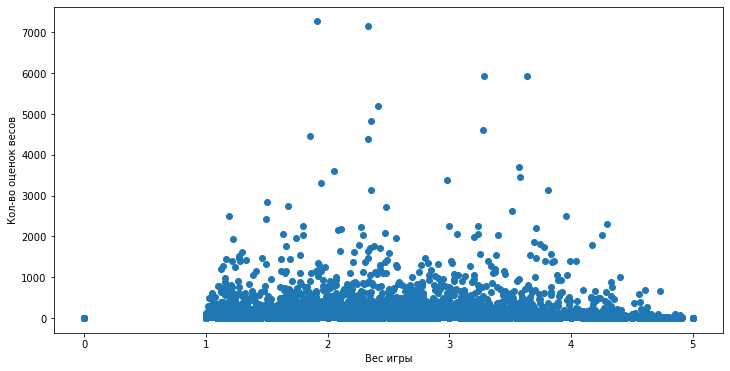

In [59]:
# Посмотрим за зависимость между признаками
plt.scatter(
    bgg_df['averageweight'],
    bgg_df['numweights'],
)
plt.xlabel("Вес игры")
plt.ylabel("Кол-во оценок весов")
plt.show()

Видим, что больше половины данных у нас не имеют значения этих признаков, поэтому равны 0.  
Довольно странно, что большинство оценок варьируется от 1 до 3. Есть предположение, что сложные игры являются менее популярными.

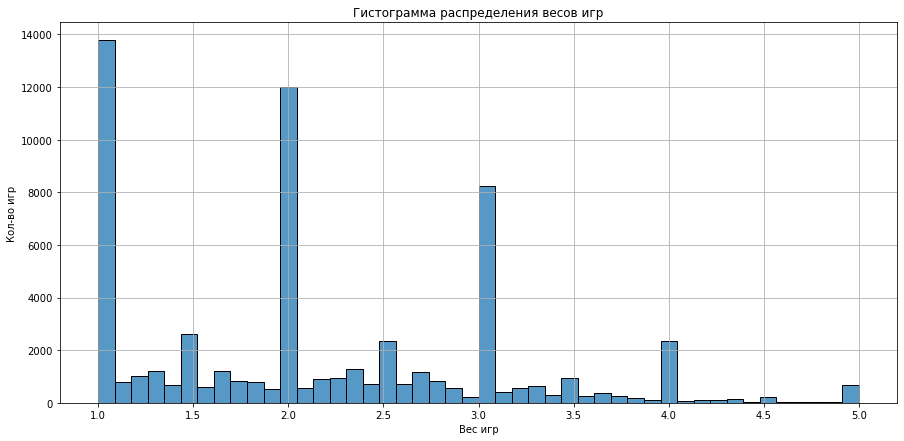

In [60]:
# Посмотрим подробнее на зависимость без нулевых значений
bgg_weight = bgg_df[bgg_df['averageweight'] > 0] # условие 

fig, axes = plt.subplots(figsize=(15, 7))
histplot=sns.histplot(
    data=bgg_weight, 
    x='averageweight',
    ax=axes
)
histplot.set_title('Гистограмма распределения весов игр')
histplot.set_ylabel('Кол-во игр')
histplot.set_xlabel('Вес игр')
histplot.grid()

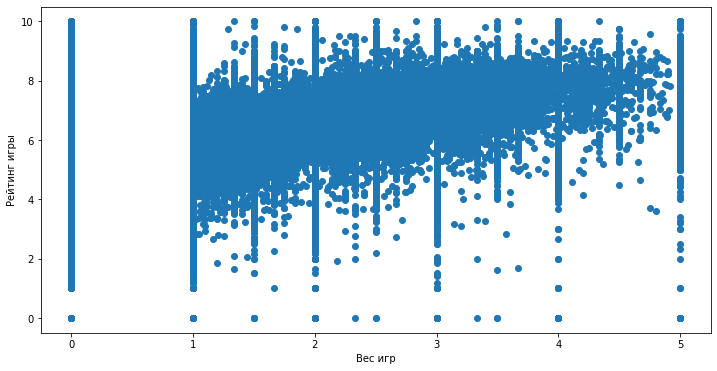

In [61]:
# Посмотрим зависимость рейтинга игры от ее сложности
plt.scatter(
    bgg_df['averageweight'],
    bgg_df['rating'],
)
plt.xlabel("Вес игр")
plt.ylabel("Рейтинг игры")
plt.show()

Можно заметить, что чем сложнее игра, тем выше ее рейтинг.

Сгруппируем игры по сложности:
* `'not weight'` = 0
* `'easy'` = от 1 до 2 
* `'norm'` = от 2 до 3
* `'hard'` = от 3 до 4
* `'very hard'` = от 4 до 5

In [62]:
# функция определяющая к какой категории сложности принадлежит игра
def weight_to_cat(weight):
    if weight == 0:
        return 'not weight'
    elif (weight >= 1) and (weight <= 2):
        return 'easy'
    elif (weight > 2) and (weight <= 3):
        return 'norm'
    elif (weight > 3) and (weight <= 4):
        return 'hard'
    elif weight > 4:
        return 'very hard'

In [63]:
# создадим новый признак, категория по сложности игр
bgg_df['cat_weight'] = bgg_df['averageweight'].apply(weight_to_cat)

not weight    106053
easy           36016
norm           18371
hard            6561
very hard       1512
Name: cat_weight, dtype: int64

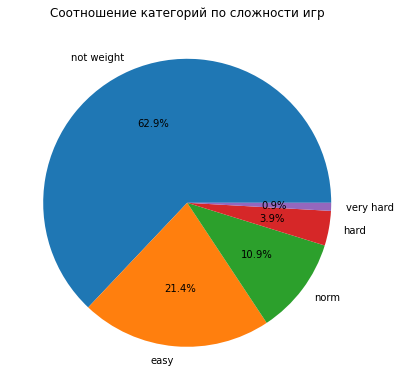

In [64]:
# посмотрим распределение
cat_weight = bgg_df['cat_weight'].value_counts()
display(cat_weight)

fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    cat_weight,
    labels=cat_weight.index,
    autopct='%.1f%%', #округление до первого знака после запятой
)
axes.set_title('Соотношение категорий по сложности игр');

Как и было замечено ранее, довольно большое кол-во настольных игр не имеет значения веса.

In [65]:
cols_cat += ['cat_weight'] # добавляем признак к категориальным

### Обработка `yearpublished`

In [66]:
display('Распределение по годам издания', bgg_df['yearpublished'].describe())

'Распределение по годам издания'

count    168513.000000
mean       1298.399008
std         956.912116
min       -3500.000000
25%           0.000000
50%        1996.000000
75%        2013.000000
max        2022.000000
Name: yearpublished, dtype: float64

Видим значения меньше нуля. Стоит рассмотреть их отдельно.

<AxesSubplot:>

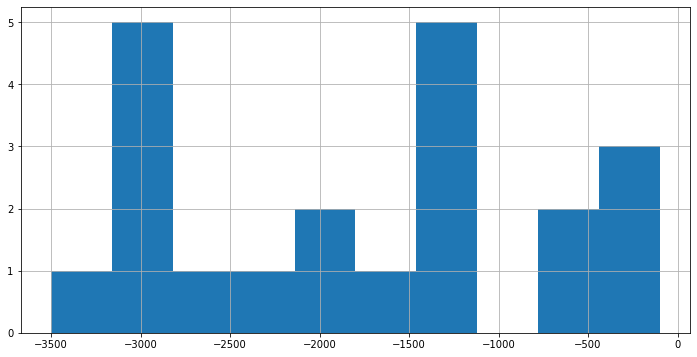

In [67]:
bgg_df[bgg_df['yearpublished'] < 0]['yearpublished'].hist()

Эти значения подразумевают появления игр до нашей эрвы, поэтому они взяты с минусом.

<AxesSubplot:>

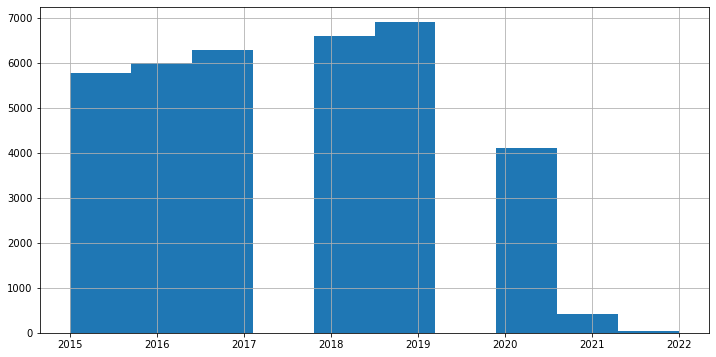

In [68]:
bgg_df[(bgg_df['yearpublished'] >= 2015)]['yearpublished'].hist()

In [69]:
bgg_df[(bgg_df['yearpublished'] == 0)]

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,player,win,number,time,move,rule,first,opponent,cat_userstar,cat_weight
418,dump,this is a prototype design about territorial c...,5.50000,0.00000,2,-1,4.50000,5,0,1,...,1,1,1,1,1,1,1,1,not pop,not weight
1016,turmbau zu babylon,from translation:object: to play correctly and...,0.00000,0.00000,0,-1,0.00000,6,0,2,...,1,1,1,1,1,1,1,1,not star,not weight
1557,heroquest: adventure design kit,"released only in europe, this kit contains ite...",6.05000,5.86420,114,-1,2.04374,276,8,65,...,1,1,1,1,1,1,1,1,pop,norm
1598,chalet,the gameboard shows a 5 streets with some gove...,4.25000,0.00000,10,-1,1.53704,53,5,1,...,1,1,1,1,1,1,1,1,not pop,norm
1603,icehouse: black ice,black ice is a two-color set of icehouse piece...,7.02222,6.23039,18,-1,1.31975,50,1,6,...,1,1,1,1,1,1,1,1,not pop,norm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285962,release,defend [your] base from incoming enemies. you ...,7.50000,0.00000,1,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,1,not pop,not weight
285963,vec-man,vec-man lives in a maze and is always hungry. ...,7.00000,0.00000,1,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,1,not pop,not weight
285964,karl quappe,karl needs to get home quickly! on his way he ...,7.00000,0.00000,1,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,1,not pop,not weight
285986,kleptokittens!,"kleptokittens! is a push your luck, memory gam...",0.00000,0.00000,0,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,1,not star,not weight


У игр со значением года выпуска ноль, вероятнее всего просто отсутсвовало значение.

In [70]:
# функция определяющая к какой категории по дате принадлежит игра
def year_to_cat(year):
    if (year < 0) or (0 < year < 1750):
        return 'ancient'
    elif (year >= 1750) and (year < 1990):
        return 'rarity'
    elif (year >= 1990) and (year < 2015):
        return 'old'
    elif year >= 2015:
        return 'new'
    elif year == 0:
        return 'not data'

In [71]:
# создадим новый признак, категория по дате появления
bgg_df['cat_yearpub'] = bgg_df['yearpublished'].apply(year_to_cat)

not data    59201
old         54594
new         36074
rarity      18467
ancient       177
Name: cat_yearpub, dtype: int64

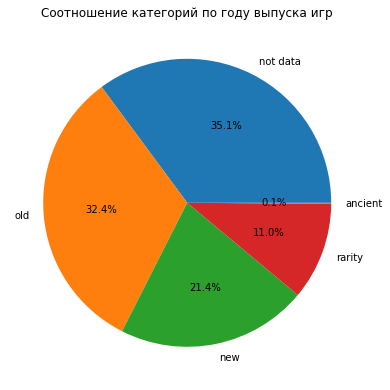

In [72]:
# посмотрим распределение
cat_year = bgg_df['cat_yearpub'].value_counts()
display(cat_year)

fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    cat_year,
    labels=cat_year.index,
    autopct='%.1f%%', #округление до первого знака после запятой
)
axes.set_title('Соотношение категорий по году выпуска игр');

Видим две основные группы - это без даты и старые игры.

In [73]:
cols_cat += ['cat_yearpub'] # добавляем признак к категориальным

### Обработка `minplayers` и `maxplayers`

Расмотрим эти признаки вместе, так как они показывают минимальное и максимальное число игроков.

In [74]:
display('Распределение минимального кол-ва игроков', bgg_df['minplayers'].describe())
display('Распределение максимального кол-ва игроков', bgg_df['maxplayers'].describe())

'Распределение минимального кол-ва игроков'

count    168513.000000
mean          1.368007
std           1.142190
min           0.000000
25%           0.000000
50%           2.000000
75%           2.000000
max          50.000000
Name: minplayers, dtype: float64

'Распределение максимального кол-ва игроков'

count    168513.000000
mean          4.210951
std          39.364243
min           0.000000
25%           0.000000
50%           3.000000
75%           5.000000
max       11299.000000
Name: maxplayers, dtype: float64

Основная масса игр с минимальным кол-ом игроков до 5, это и логично. А вот аномально большое значение - 11299 похоче на ошибку.

<AxesSubplot:>

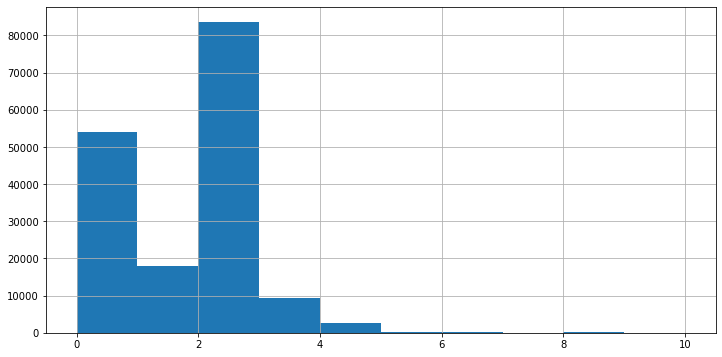

In [75]:
# построим распределение с минимальным кол-ом игроков менее или равно 10
bgg_df[bgg_df['minplayers'] <= 10]['minplayers'].hist()

In [76]:
# посмотрим какие игры имеют минимальное кол-во игроков больше 20
bgg_df[bgg_df['minplayers'] > 20]

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,win,number,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub
16980,guns or butter,&quot;guns or butter models an international s...,6.00000,0.0,1,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,not pop,not weight,rarity
16985,innocent until...,&quot;this role-play exercise simulates the co...,0.00000,0.0,0,-1,0.00000,0,0,1,...,1,1,1,1,1,1,1,not star,not weight,rarity
21257,st. cakes,from the publisher's web site:a chance to be a...,0.00000,0.0,0,-1,0.00000,0,0,1,...,1,1,1,1,1,1,1,not star,not weight,not data
30550,piratenhändler,"a game created for bgg.con 2007, loosely based...",5.66667,0.0,3,-1,1.24722,1,0,0,...,1,1,1,1,1,1,1,not pop,not weight,old
57126,zauberenhändler,"the trading card game for bgg.con 2009, based ...",0.00000,0.0,0,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,not star,not weight,old
244706,first battle,first battle is real war game simulation creat...,7.00000,0.0,1,-1,0.00000,1,0,0,...,1,1,1,1,1,1,1,not pop,not weight,rarity


Это не популярные игры, и у них отсутствует рейтинг BGG.

<AxesSubplot:>

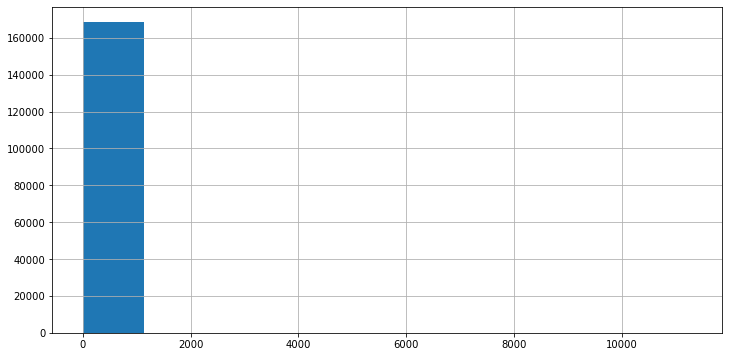

In [77]:
# построим распределение максимального кол-ва игроков
bgg_df['maxplayers'].hist()

<AxesSubplot:>

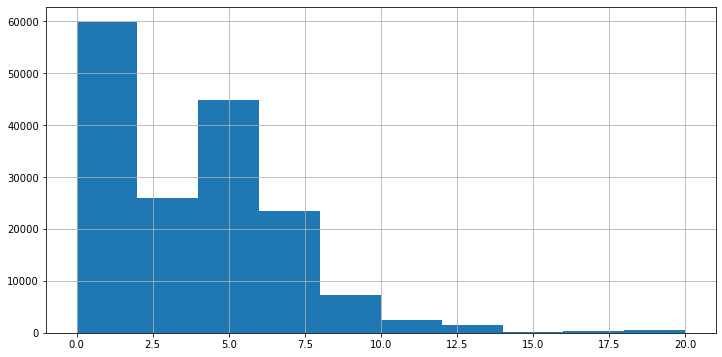

In [78]:
# руководствуясь логикой, построим распределение с максимальным кол-ом игроков менее или равно 20
bgg_df[bgg_df['maxplayers'] <= 20]['maxplayers'].hist()

In [79]:
bgg_df[bgg_df['maxplayers'] > 20]

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,win,number,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub
48,ricochet robots,ricochet robots is less of a game and more of ...,7.00378,6.73281,7725,660,1.65454,7890,129,202,...,1,1,1,1,1,1,1,star,norm,old
557,25 words or less,players divide up into two teams. the current...,6.52943,5.75302,507,3966,1.44533,737,49,15,...,1,1,1,1,1,1,1,pop,easy,old
583,fairy meat,fairy meat is kenzer &amp; company's acclaimed...,5.92553,5.52231,85,12744,1.62984,204,10,13,...,1,1,1,1,1,1,1,not pop,easy,old
656,hollywood's reel schpeel,described by the publisher/designer:players re...,5.80000,0.00000,5,-1,1.60000,15,1,0,...,1,1,1,1,1,1,1,not pop,not weight,old
763,weapons & warriors: castle combat set,"a simple action game. basically, you each hav...",5.93756,5.57319,467,7991,1.67093,1068,76,22,...,1,1,1,1,1,1,1,pop,easy,old
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285265,caught on tape,a player takes a piece of tape from a roll of ...,0.00000,0.00000,0,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,not star,not weight,new
285436,harry potter: reveal the death eaters,"in harry potter: reveal the death eaters, the ...",0.00000,0.00000,0,-1,0.00000,0,0,0,...,1,1,1,1,1,1,1,not star,not weight,new
285481,tenun tycoon,play as a team of business minded people and l...,0.00000,0.00000,0,-1,0.00000,2,0,0,...,1,1,1,1,1,1,1,not star,norm,new
285756,dropsy,players take turns drawing cards until someone...,0.00000,0.00000,0,-1,0.00000,1,0,0,...,1,1,1,1,1,1,1,not star,not weight,new


Видим довольно большое кол-во игр с максимальным кол-ом игроков больше 20.

In [80]:
# функция определяющая к какой категории по кол-ву игроков
def players_to_cat(players):
    if players == 1:
        return 'solo'
    elif players == 2:
        return 'duel'
    elif (players >= 3) and (players <= 8):
        return 'group'
    elif players > 8:
        return 'party'
    elif players == 0:
        return 'not players'

In [81]:
# создадим новые признаки, категории по кол-ву игроков
bgg_df['cat_minplay'] = bgg_df['minplayers'].apply(players_to_cat)
bgg_df['cat_play'] = bgg_df['maxplayers'].apply(players_to_cat)

In [82]:
cols_cat += ['cat_minplay', 'cat_play'] # добавим признаки к категориальным

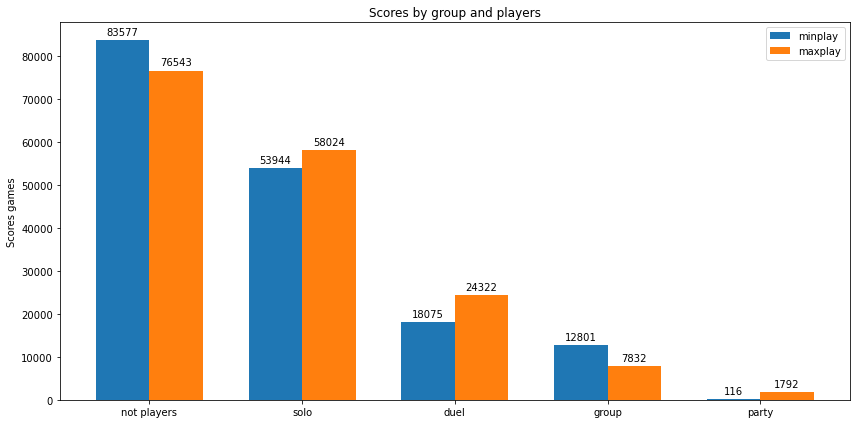

In [83]:
labels = ['not players', 'solo', 'duel', 'group', 'party']
minplay = bgg_df['cat_minplay'].value_counts()
play = bgg_df['cat_play'].value_counts()

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, minplay, width, label='minplay')
rects2 = ax.bar(x + width/2, play, width, label='maxplay')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores games')
ax.set_title('Scores by group and players')
ax.set_xticks(x, labels)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

In [84]:
# проверим на ошибки, так как минимальное кол-во не может превышать максимальное
bgg_df[bgg_df['maxplayers'] < bgg_df['minplayers']][['maxplayers', 'minplayers']]

,maxplayers,minplayers
520,0,2
811,0,2
2033,0,2
2336,0,1
2863,0,3
...,...,...
284019,0,1
285098,0,2
285783,0,4
285966,0,2


Нулевое значение `maxplayers` скорей всего свидетельствует об отсутствии значения. 

In [85]:
# проверим на ошибки, исключив нулевые значения maxplayers
bgg_df[(bgg_df['maxplayers'] < bgg_df['minplayers']) & (bgg_df['maxplayers'] != 0)][['maxplayers', 'minplayers']]

,maxplayers,minplayers


Проверка показала, что ошибок нет. А максимальное кол-во равное 0 можно интерпретировать как остуствие значения, то есть никакого противоречия тут нет.

### Обработка `playingtime`, `minplaytime`, `maxplaytime`

Обрабатываем признаки `playingtime`, `minplaytime`, `maxplaytime` вместе, так как они все говорят нам про время игры.

In [86]:
display('Время партии', bgg_df['playingtime'].describe())
display('Минимальное время партии', bgg_df['minplaytime'].describe())
display('Максимальное время партии', bgg_df['maxplaytime'].describe())

'Время партии'

count    1.685130e+05
mean     2.389168e+02
std      7.328363e+04
min      0.000000e+00
25%      0.000000e+00
50%      1.500000e+01
75%      4.500000e+01
max      3.000000e+07
Name: playingtime, dtype: float64

'Минимальное время партии'

count    168513.000000
mean         31.502133
std         449.297195
min           0.000000
25%           0.000000
50%          10.000000
75%          30.000000
max      157680.000000
Name: minplaytime, dtype: float64

'Максимальное время партии'

count    1.685130e+05
mean     2.383709e+02
std      7.328363e+04
min      0.000000e+00
25%      0.000000e+00
50%      1.500000e+01
75%      4.500000e+01
max      3.000000e+07
Name: maxplaytime, dtype: float64

По значениям можем понять, что время указано в минутах.

In [87]:
# переведем в часы
bgg_df['playingtime'] = round(bgg_df['playingtime'] / 60, 2)
bgg_df['minplaytime'] = round(bgg_df['minplaytime'] / 60, 2)
bgg_df['maxplaytime'] = round(bgg_df['maxplaytime'] / 60, 2)

In [88]:
# теперь посмотрим на распределение в часах
display('Время партии в минутах', bgg_df['playingtime'].describe())
display('Минимальное время партии в минутах', bgg_df['minplaytime'].describe())
display('Максимальное время партии в минутах', bgg_df['maxplaytime'].describe())

'Время партии в минутах'

count    168513.000000
mean          3.981880
std        1221.393805
min           0.000000
25%           0.000000
50%           0.250000
75%           0.750000
max      500000.000000
Name: playingtime, dtype: float64

'Минимальное время партии в минутах'

count    168513.000000
mean          0.524949
std           7.488290
min           0.000000
25%           0.000000
50%           0.170000
75%           0.500000
max        2628.000000
Name: minplaytime, dtype: float64

'Максимальное время партии в минутах'

count    168513.000000
mean          3.972786
std        1221.393830
min           0.000000
25%           0.000000
50%           0.250000
75%           0.750000
max      500000.000000
Name: maxplaytime, dtype: float64

Все равно видим довольно большие значения.

In [89]:
# посчитаем кол-во нулевых значений для времени игры и максимального времени игры
print(len(bgg_df[bgg_df['playingtime'] == 0]))
len(bgg_df[bgg_df['maxplaytime'] == 0])

74485


76723

In [90]:
bgg_df[bgg_df['playingtime'] > 5000] # кол-во игр с аномальным временем игры

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub,cat_minplay,cat_play
208481,再会の約束 (saikai no yakusoku),publisher's summary再会の約束 (saikai no yakusoku) ...,3.00000,0.0,1,-1,0.000000,3,1,0,...,1,1,1,1,1,not pop,not weight,new,duel,group
212260,ars combinatoria,ars combinatoria is a collection of five games...,6.16667,0.0,6,-1,0.687184,32,5,1,...,1,1,1,1,1,not pop,not weight,new,duel,group
283464,office space: the game,this is a secret missions game to play at work...,0.00000,0.0,0,-1,0.000000,0,0,0,...,1,1,1,1,1,not star,not weight,new,duel,party


In [91]:
bgg_df = bgg_df.loc[bgg_df['playingtime'] < 5000] # убираем выбросы

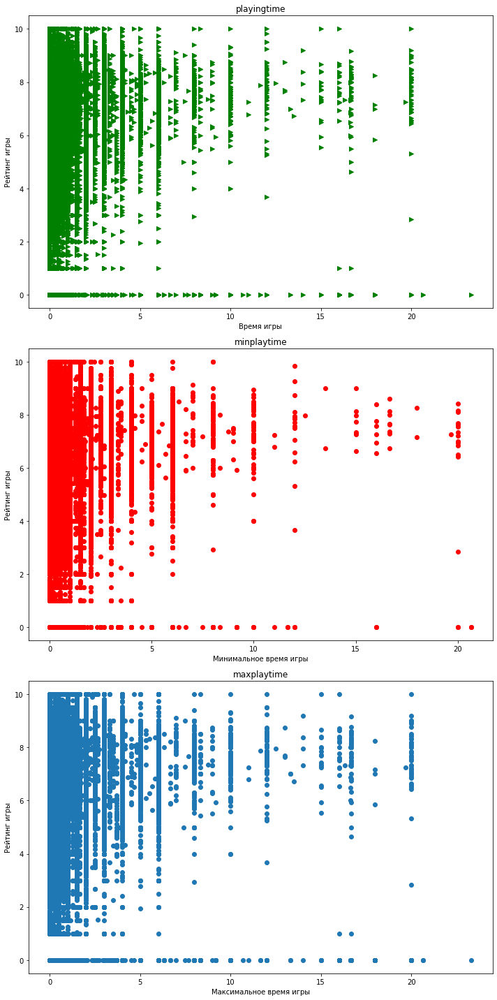

In [92]:
# посмотрим распределение с временем игры менее суток
fig, axs = plt.subplots(3, 1, figsize=(10, 20))

playtime = bgg_df[bgg_df['playingtime'] < 24]
minplaytime = bgg_df[bgg_df['minplaytime'] < 24]
maxplaytime = bgg_df[bgg_df['maxplaytime'] < 24]

# owned
axs[0].scatter(
    playtime['playingtime'],
    playtime['rating'],
    marker=">",
    color='g'
)
axs[0].set_title("playingtime")
axs[0].set_xlabel("Время игры")
axs[0].set_ylabel("Рейтинг игры")

# trading
axs[1].scatter(
    minplaytime['minplaytime'],
    minplaytime['rating'],
    marker="o",
    color='r'
)
axs[1].set_title("minplaytime")
axs[1].set_xlabel("Минимальное время игры")
axs[1].set_ylabel("Рейтинг игры")

# wishing
axs[2].scatter(
    maxplaytime['maxplaytime'],
    maxplaytime['rating']
)
axs[2].set_title("maxplaytime")
axs[2].set_xlabel("Максимальное время игры")
axs[2].set_ylabel("Рейтинг игры")

plt.tight_layout()
plt.show()

Основная масса настольных игр расчитана на игру менее 5-ти часов.

In [93]:
# проверим на ошибки, время игры и максимальное время не должно быть меньше минимального
display(bgg_df[(bgg_df['maxplaytime'] != 0) & (bgg_df['maxplaytime'] < bgg_df['minplaytime'])])
display(bgg_df[(bgg_df['playingtime'] != 0) & (bgg_df['playingtime'] < bgg_df['minplaytime'])])
display(bgg_df[(bgg_df['playingtime'] != 0) & (bgg_df['playingtime'] > bgg_df['maxplaytime'])])

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub,cat_minplay,cat_play
6643,blacks & whites,warning: this game explores issues of racial i...,5.02500,0.00000,18,-1,1.856540,68,4,11,...,1,1,1,1,1,not pop,easy,rarity,group,party
85428,scotland yard: hunting mister x,scotland yard: die jagd nach mister x is a sma...,5.83400,5.53320,220,11352,1.423580,793,28,2,...,1,1,1,1,1,pop,easy,old,duel,group
93177,gorilla,a card game similar in many ways to uno. there...,6.16667,0.00000,12,-1,1.280190,42,0,0,...,1,1,1,1,1,not pop,easy,old,group,group
126912,clacks: a discworld board game,clacks: a discworld board game is based on the...,6.31447,5.64846,356,5506,1.597170,941,19,44,...,1,1,1,1,1,pop,norm,new,solo,group
133100,a game for good christians,"from the publisher:for the first round, each p...",5.95600,0.00000,25,-1,2.184140,55,2,0,...,1,1,1,1,1,not pop,easy,old,group,group
153769,stomp-ede!,stomp-ede! is a dinosaur themed trick taking g...,0.00000,0.00000,0,-1,0.000000,1,0,0,...,1,1,1,1,1,not star,not weight,not data,duel,group
159980,heroic hustle,heroic hustle is a fully cooperative team-base...,0.00000,0.00000,0,-1,0.000000,2,0,0,...,1,1,1,1,1,not star,not weight,not data,duel,group
160916,lr fraustadt 1706,a simple fast treatment of a small great north...,10.00000,0.00000,1,-1,0.000000,1,0,0,...,1,1,1,1,1,not pop,not weight,new,duel,duel
162870,heroes of normandie: gazette #3,heroes of normandie: gazette #3 is the third i...,8.39113,5.58576,47,-1,1.089340,430,6,12,...,1,1,1,1,1,not pop,not weight,new,duel,duel
163266,the win/lose/draw game of gettsyburg,similar game to monopoly or easy money. local ...,0.00000,0.00000,0,-1,0.000000,1,0,0,...,1,1,1,1,1,not star,not weight,not data,duel,group


,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub,cat_minplay,cat_play


,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,time,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub,cat_minplay,cat_play
6643,blacks & whites,warning: this game explores issues of racial i...,5.02500,0.0,18,-1,1.85654,68,4,11,...,1,1,1,1,1,not pop,easy,rarity,group,party
10934,playmobil: alarm! alarm!,goal is to get rid of your own cards as fast a...,4.20000,0.0,5,-1,1.93907,15,2,0,...,1,1,1,1,1,not pop,easy,old,duel,group
14738,trafalgar,"a legendary early self-produced, and according...",7.88889,0.0,9,-1,1.59474,15,0,21,...,1,1,1,1,1,not pop,norm,rarity,duel,duel
18621,stalag luft iii: the great escape,"stalag luft iii - the great escape, is game sy...",4.00000,0.0,4,-1,1.58114,11,1,1,...,1,1,1,1,1,not pop,not weight,old,duel,duel
19643,napoleon dynamite: it's pretty much my favorit...,&quot;it's pretty much my favorite animal. it'...,5.39655,0.0,29,-1,1.98867,68,5,1,...,1,1,1,1,1,not pop,easy,old,group,group
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281567,doudou,doudou is a cooperative investigative game for...,0.00000,0.0,0,-1,0.00000,0,0,0,...,1,1,1,1,1,not star,not weight,new,solo,group
282567,fruits,fruits is a game in which we must combine memo...,10.00000,0.0,8,-1,0.00000,4,0,0,...,1,1,1,1,1,not pop,not weight,new,duel,group
283671,legends of dragons: the card game,a bold and fun experience that combines imagin...,10.00000,0.0,1,-1,0.00000,1,0,0,...,1,1,1,1,1,not pop,not weight,new,solo,party
284608,cthulhu wars: glow in the dark cthulhu,180mm tall cthulhu cast in glow-in-the-dark pl...,0.00000,0.0,0,-1,0.00000,9,0,0,...,1,1,1,1,1,not star,not weight,new,duel,group


In [94]:
# создадим новый признак, который объединит playingtime и maxplaytime
def playtime_num(line):
    if line['playingtime'] != 0:
        return line['playingtime']
    elif line['maxplaytime'] != 0:
        return line['maxplaytime']
    else:
        return line['minplaytime']

In [95]:
bgg_df['playtime'] = bgg_df.apply(playtime_num, axis=1)

In [96]:
bgg_df[['playingtime', 'maxplaytime', 'minplaytime', 'playtime']].sample(10)

,playingtime,maxplaytime,minplaytime,playtime
128838,1.00,1.00,1.00,1.00
72838,0.00,0.00,0.00,0.00
271188,0.50,0.50,0.25,0.50
13818,0.00,0.00,0.00,0.00
12108,0.50,0.50,0.50,0.50
52128,0.00,0.00,0.00,0.00
41164,0.00,0.00,0.00,0.00
122628,0.33,0.33,0.33,0.33
179723,0.25,0.00,0.25,0.25
137923,0.00,0.00,0.00,0.00


In [97]:
bgg_df.drop(['playingtime', 'maxplaytime'], axis = 1, inplace=True) # удаляем ненужные столбцы

In [98]:
cols_num += ['playtime'] # добавляем к числовым признакам
cols_num.remove('playingtime') # удаляем из списка числовых признаков
cols_num.remove('maxplaytime') # удаляем из списка числовых признаков

### Обработка `age`

In [99]:
# строим распределение признака
display(bgg_df['age'].describe())

count    168510.000000
mean          5.416005
std           5.478762
min           0.000000
25%           0.000000
50%           5.000000
75%          10.000000
max         112.000000
Name: age, dtype: float64

<AxesSubplot:xlabel='age', ylabel='rating'>

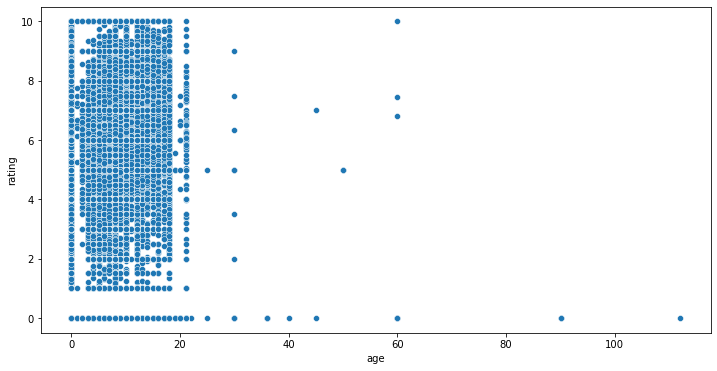

In [100]:
# построим зависимость возраста от рейтинга
sns.scatterplot(data=bgg_df, x='age', y='rating')

Основной возрастной дианазон от 0 до 22. Наблюдаем также аномальные значения 60 лет.

In [101]:
bgg_df[bgg_df['age'] >= 60]

,name,description,rating,bayes_rating,usersrated,bggrank,stddev,owned,trading,wanting,...,move,rule,first,opponent,cat_userstar,cat_weight,cat_yearpub,cat_minplay,cat_play,playtime
29237,the game of broken arrow,monopoly clone made for the town of broken arr...,0.00000,0.0000,0,-1,0.00000,0,0,0,...,1,1,1,1,not star,not weight,old,duel,group,0.00
57154,a-hah! memoritz,a-hah! memoritz is a collection of games that ...,0.00000,0.0000,0,-1,0.00000,1,0,0,...,1,1,1,1,not star,not weight,old,solo,group,0.00
57155,a-hah! fruito,a-hah! fruito is a set of 40 cards consisting ...,0.00000,0.0000,0,-1,0.00000,0,0,0,...,1,1,1,1,not star,not weight,old,solo,group,0.00
59609,memoldy,when a player lands with his pawn on a questio...,0.00000,0.0000,0,-1,0.00000,0,0,0,...,1,1,1,1,not star,not weight,old,duel,group,0.50
80335,htpsim,simulation of a cycling race. it is possible t...,0.00000,0.0000,0,-1,0.00000,0,0,0,...,1,1,1,1,not star,not weight,old,solo,duel,0.02
194636,villages of valeria: rahdo the guild master pr...,promo card included in game trade magazine #20...,7.43939,5.5417,33,-1,1.18550,363,11,30,...,1,1,1,1,not pop,not weight,new,solo,group,0.50
225802,ultimate werewolf legacy: replay pack,an ultimate werewolf legacy: replay pack conta...,0.00000,0.0000,0,-1,0.00000,10,0,1,...,1,1,1,1,not star,not weight,new,group,party,1.00
244361,jim henson's labyrinth the board game: fireys!...,the fireys! expansion for jim henson&rsquo;s l...,6.81818,0.0000,11,-1,1.84973,79,0,3,...,1,1,1,1,not pop,not weight,new,solo,group,1.50
272184,zombicide (2nd edition): urban legends abomina...,the urban legends abominations pack brings 4 d...,10.00000,0.0000,1,-1,0.00000,13,0,2,...,1,1,1,1,not pop,not weight,new,solo,group,0.00
281162,mythos: the dreamlands,mythos: the dreamlands (1997) introduced the c...,0.00000,0.0000,0,-1,0.00000,4,0,0,...,1,1,1,1,not star,not weight,old,duel,party,0.75


In [102]:
bgg_df = bgg_df[bgg_df['age'] <= 80] # убираем самые аномальные значения

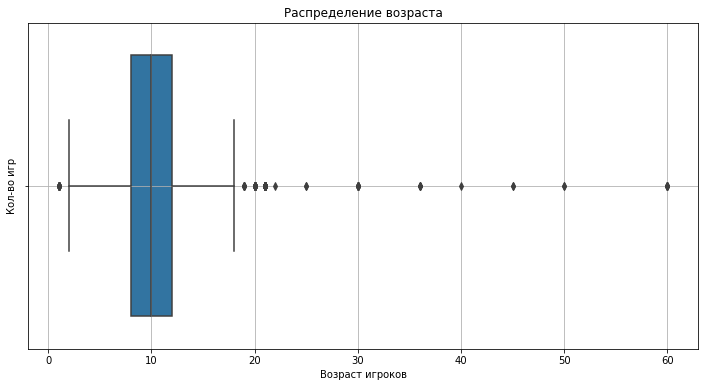

In [103]:
# посмотрим распределение без нулевых значений
palyers_age_imp = bgg_df[bgg_df['age'] != 0]

boxplot=sns.boxplot(
    data=palyers_age_imp,
    x='age',
    orient='h'
)
boxplot.set_title('Распределение возраста')
boxplot.set_ylabel('Кол-во игр')
boxplot.set_xlabel('Возраст игроков')
boxplot.grid()

In [104]:
print('Кол-во игр с возрастом игроков 0 = ', len(bgg_df[bgg_df['age'] == 0]))
print('Кол-во игр с возрастом игроков больше  30 = ', len(bgg_df[bgg_df['age'] >= 30]))

Кол-во игр с возрастом игроков 0 =  75803
Кол-во игр с возрастом игроков больше  30 =  26


### Рассмотрим целевую переменную

In [105]:
display('Распределение рейтинга', bgg_df['rating'].describe())
display('Распределение Байесовский ретинг', bgg_df['bayes_rating'].describe())

'Распределение рейтинга'

count    168507.000000
mean          5.364170
std           2.801069
min           0.000000
25%           4.296520
50%           6.177470
75%           7.286165
max          10.000000
Name: rating, dtype: float64

'Распределение Байесовский ретинг'

count    168507.000000
mean          1.397474
std           2.501358
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           8.574320
Name: bayes_rating, dtype: float64

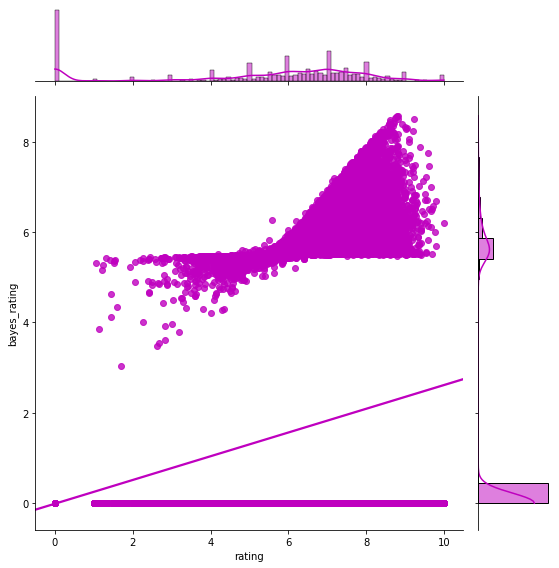

In [107]:
# построим зависимость bayes_rating и rating
# так как есть предположение, что bayes_rating дублирует информацию о целевой переменной
g = sns.jointplot(x="rating",
                  y="bayes_rating",
                  data=bgg_df,
                  kind="reg",
                  truncate=False, 
                  color="m",
                  height=8)

In [108]:
# кол-во нулевых значений bayes_rating
(len(bgg_df[bgg_df['bayes_rating'] == 0]))

128173

In [110]:
cols_num += ['bayes_rating'] # добавляем к числовым признакам
col_target.remove('bayes_rating') # удаляем из списка целевой переменной

### Обработка признаков для последующей работы с моделями машинного обучения

In [111]:
print(cols_num) # список числовых признаков

['usersrated', 'bggrank', 'stddev', 'owned', 'trading', 'wanting', 'wishing', 'numweights', 'averageweight', 'yearpublished', 'minplayers', 'maxplayers', 'minplaytime', 'age', 'len_name', 'len_description', 'playtime', 'bayes_rating', 'bayes_rating']


In [116]:
cols_to_log = ['usersrated', 'owned', 'trading',
               'wanting', 'wishing', 'numweights',
               'yearpublished', 'minplaytime', 'len_name',
               'len_description', 'playtime']

In [117]:
# логарифмируем признаки
bgg_log_num = pd.DataFrame()
cols_log = []

for col in cols_to_log:
    bgg_log_num['log_'+ col] = round(np.log(bgg_df[col] + 1), 3)
    cols_log += ['log_'+ col]

bgg_log_num

,log_usersrated,log_owned,log_trading,log_wanting,log_wishing,log_numweights,log_yearpublished,log_minplaytime,log_len_name,log_len_description,log_playtime
0,8.528,8.833,5.468,6.256,7.581,6.621,7.594,1.609,2.398,7.145,1.609
1,6.303,7.120,4.234,4.248,5.170,4.007,7.592,0.405,2.565,6.795,0.405
2,9.570,9.599,5.707,6.603,8.062,7.268,7.600,0.405,2.079,7.052,0.693
3,5.814,6.425,3.664,4.111,4.804,3.434,7.597,0.693,2.708,6.384,0.693
4,9.787,10.024,6.795,6.246,7.829,7.370,7.583,0.916,2.079,6.709,0.916
...,...,...,...,...,...,...,...,...,...,...,...
286147,0.000,0.000,0.000,0.000,0.000,0.000,7.611,0.405,3.219,6.810,1.099
286151,0.693,0.000,0.000,0.000,0.693,0.000,7.611,1.099,3.497,6.872,1.609
286156,0.000,0.000,0.000,0.000,0.000,0.000,7.611,0.693,4.007,6.219,1.386
286160,0.000,0.000,0.000,0.000,0.000,0.000,7.611,1.099,3.332,6.730,1.609


In [118]:
bgg_log_num.isnull().sum()

log_usersrated          0
log_owned               0
log_trading             0
log_wanting             0
log_wishing             0
log_numweights          0
log_yearpublished      21
log_minplaytime         0
log_len_name            0
log_len_description     0
log_playtime            0
dtype: int64

In [119]:
bgg_log_num['log_yearpublished'].fillna(-1, inplace=True) # заменяем пропуски в данных

In [120]:
print(cols_cat)
print(cols_bin)

['cat_userstar', 'cat_weight', 'cat_yearpub', 'cat_minplay', 'cat_play']
['card_name', 'battle_name', 'board_game_name', 'game', 'monopoly', 'expansion', 'war', 'king', 'second edition', 'expansion pack', 'dice', 'card_d', 'game_d', 'battle_d', 'one', 'bord', 'play', 'quot', 'turn', 'player', 'win', 'number', 'time', 'move', 'rule', 'first', 'opponent']


In [121]:
# уникальные значения категориальных признаков
for col in cols_cat:
    print(col, bgg_df[col].unique())

cat_userstar ['star' 'pop' 'not pop' 'super star' 'not star']
cat_weight ['very hard' 'easy' 'norm' 'hard' 'not weight']
cat_yearpub ['rarity' 'old' 'ancient' 'not data' 'new']
cat_minplay ['group' 'duel' 'solo' 'not players' 'party']
cat_play ['group' 'duel' 'party' 'not players' 'solo']


In [122]:
# задаем собственное ранжирование признаков
bgg_df['cat_userstar'] = bgg_df['cat_userstar'].map({'not star': 0,
                                                     'not pop': 1,
                                                     'pop': 2,
                                                     'star': 3,
                                                     'super star':4})

bgg_df['cat_weight'] = bgg_df['cat_weight'].map({'not weight': 0,
                                                     'easy': 1,
                                                     'norm': 2,
                                                     'hard': 3,
                                                     'very hard':4})

bgg_df['cat_yearpub'] = bgg_df['cat_yearpub'].map({'not data': 0,
                                                     'ancient': 1,
                                                     'rarity': 2,
                                                     'old': 3,
                                                     'new':4})

In [123]:
# создаем dummies переменные
bgg_df = bgg_df.join(pd.get_dummies(bgg_df[['cat_minplay', 'cat_play']]))

In [124]:
# добавляем признаки к списку бинарных
cols_bin += ['cat_minplay_duel', 'cat_minplay_group', 'cat_minplay_not players',
             'cat_minplay_party', 'cat_minplay_solo', 'cat_play_duel',
             'cat_play_group', 'cat_play_not players', 'cat_play_party',
             'cat_play_solo']

In [125]:
# удаляем ненужные категориальные признаки
bgg_df.drop(['cat_minplay', 'cat_play'], axis = 1, inplace=True)
cols_cat.remove('cat_minplay')
cols_cat.remove('cat_play')

Получился итоговый обработанный датасет

In [126]:
bgg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168507 entries, 0 to 286185
Data columns (total 61 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   name                     168507 non-null  object 
 1   description              168507 non-null  object 
 2   rating                   168507 non-null  float64
 3   bayes_rating             168507 non-null  float64
 4   usersrated               168507 non-null  int64  
 5   bggrank                  168507 non-null  int64  
 6   stddev                   168507 non-null  float64
 7   owned                    168507 non-null  int64  
 8   trading                  168507 non-null  int64  
 9   wanting                  168507 non-null  int64  
 10  wishing                  168507 non-null  int64  
 11  numweights               168507 non-null  int64  
 12  averageweight            168507 non-null  float64
 13  yearpublished            168507 non-null  int64  
 14  minp

In [127]:
print(len(cols_cat) + len(cols_bin) + len(cols_num))

59


In [128]:
print(cols_num)
print(cols_log)
print(cols_cat)
print(cols_bin)

['usersrated', 'bggrank', 'stddev', 'owned', 'trading', 'wanting', 'wishing', 'numweights', 'averageweight', 'yearpublished', 'minplayers', 'maxplayers', 'minplaytime', 'age', 'len_name', 'len_description', 'playtime', 'bayes_rating', 'bayes_rating']
['log_usersrated', 'log_owned', 'log_trading', 'log_wanting', 'log_wishing', 'log_numweights', 'log_yearpublished', 'log_minplaytime', 'log_len_name', 'log_len_description', 'log_playtime']
['cat_userstar', 'cat_weight', 'cat_yearpub']
['card_name', 'battle_name', 'board_game_name', 'game', 'monopoly', 'expansion', 'war', 'king', 'second edition', 'expansion pack', 'dice', 'card_d', 'game_d', 'battle_d', 'one', 'bord', 'play', 'quot', 'turn', 'player', 'win', 'number', 'time', 'move', 'rule', 'first', 'opponent', 'cat_minplay_duel', 'cat_minplay_group', 'cat_minplay_not players', 'cat_minplay_party', 'cat_minplay_solo', 'cat_play_duel', 'cat_play_group', 'cat_play_not players', 'cat_play_party', 'cat_play_solo']


In [129]:
# добавляем логарифмированные признаки к датасету
bgg_df_new = pd.concat([bgg_df, bgg_log_num], axis=1)

In [130]:
# Сохраняем полученные данные в файл
bgg_df_new.to_csv('data/bgg_data_full_eda.csv', index=False)